<a href="https://colab.research.google.com/github/pauljohn99/ML-learnings/blob/main/Copy_of_smile_simulation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [156]:
!python -m pip install pyyaml==5.1
import sys, os, distutils.core
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities.
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))

# Properly install detectron2. (Please do not install twice in both ways)
# !python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
fatal: destination path 'detectron2' already exists and is not an empty directory.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached numpy-1.24.2-cp39-cp39-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (17.3 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 1.19.5
    Uninstalling numpy-1.19.5:
      Successfully uninstalled numpy-1.19.5
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
numba 0.56.4 requires numpy<1.24,>=1.18, but you have numpy 1.24.2 which is incompatible.


In [157]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2022 NVIDIA Corporation
Built on Wed_Sep_21_10:33:58_PDT_2022
Cuda compilation tools, release 11.8, V11.8.89
Build cuda_11.8.r11.8/compiler.31833905_0
torch:  1.13 ; cuda:  cu116
detectron2: 0.6


In [158]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [159]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [160]:
from detectron2.structures import BoxMode

def load_data(annotation_json, images_dir):
   
    json_file = open(annotation_json)
    coco_json = json.load(json_file)
    json_file.close()

    dataset_dicts = []
    for category in coco_json['categories']:
            class_id = category['id']
            class_name = category['name']
    
    for image in coco_json['images']:
        record = {}
        record["image_id"]=image['id']
        
        record["height"]= image['height']
        record["width"]= image['width']
        print("record1111111",record)


        image_file_name = image['file_name']
        image_file_name = image_file_name.split('-',1)[1]
        print("image_file_name=",image_file_name)
        image_path = os.path.abspath(os.path.join(images_dir, image_file_name))
        record["file_name"] =image_path
        print("record222222",record)
        objs = []
        annotations = {}
        for annotation in coco_json['annotations']:
             if(record["image_id"]==annotation['image_id']):
                segmentation=annotation["segmentation"]
                # print("segmenation====",segmentation)
                
                all_x = []
                all_y = []
                for i in range(0, len(segmentation[0])):
                   if i % 2:
                    all_y.append(segmentation[0][i])
                   else :
                    all_x.append(segmentation[0][i])
                # print("all_x===", all_x)   

               


                obj={
                    "bbox": [np.min(all_x), np.min(all_y), np.max(all_x), np.max(all_y)],
                    "bbox_mode": BoxMode.XYXY_ABS,
                    "segmentation":segmentation,
                    "category_id": 0,
                }
                objs.append(obj)
        record["annotations"] = objs
        print("record===",record["annotations"])
        dataset_dicts.append(record)
        print("dataset====",dataset_dicts)
    return dataset_dicts
                  
for d in ["train", "val"]:
    DatasetCatalog.register("balloon_" + d, lambda d=d: load_data("/content/drive/MyDrive/result.json", "/content/drive/MyDrive/teeth-mask-rcnn"))
    MetadataCatalog.get("balloon_" + d).set(thing_classes=["teeth"])
balloon_metadata = MetadataCatalog.get("balloon_train")

AssertionError: ignored

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[{'image_id': 0, 'height': 4000, 'width': 6000, 'file_name': '/content/drive/MyDrive/teeth-mask-rcnn/COMPOSITE_PHOTO-CAZFG41770_310721041401.jpeg', 'annotations': [{'bbox': [2665.2520487291395, 2766.179013894782, 2725.3200532305273, 2836.6580369111057], 'bbox_mode': <BoxMode.XYXY_ABS: 0>, 'segmentation': [[2722.213087480456, 2836.6580369111057, 2699.4286719799293, 2824.220562261166, 2670.4303249792592, 2812.819543832055, 2665.2520487291395, 2792.0904194154896, 2668.3590144792115, 2766.179013894782, 2680.786877479499, 2768.251926336439, 2692.1790852297618, 2783.798769648863, 2704.606948230049, 2799.3456129612873, 2725.3200532305273, 2808.673718948742, 2724.2465081542623, 2818.343097106467]], 'category_id': 0}, {'bbox': [2730.498329480648, 2778.6164885447215, 2775.0315052316764, 2858.4236175485], 'bbox_mode': <BoxMode.XYXY_ABS: 0>, 'segmentation': [[2730.498329480648, 2838.730949352763, 2732.5696399806952, 2784.8352258696914, 2738.783571480839, 2778.6164885447215, 2746.0331582310064, 278

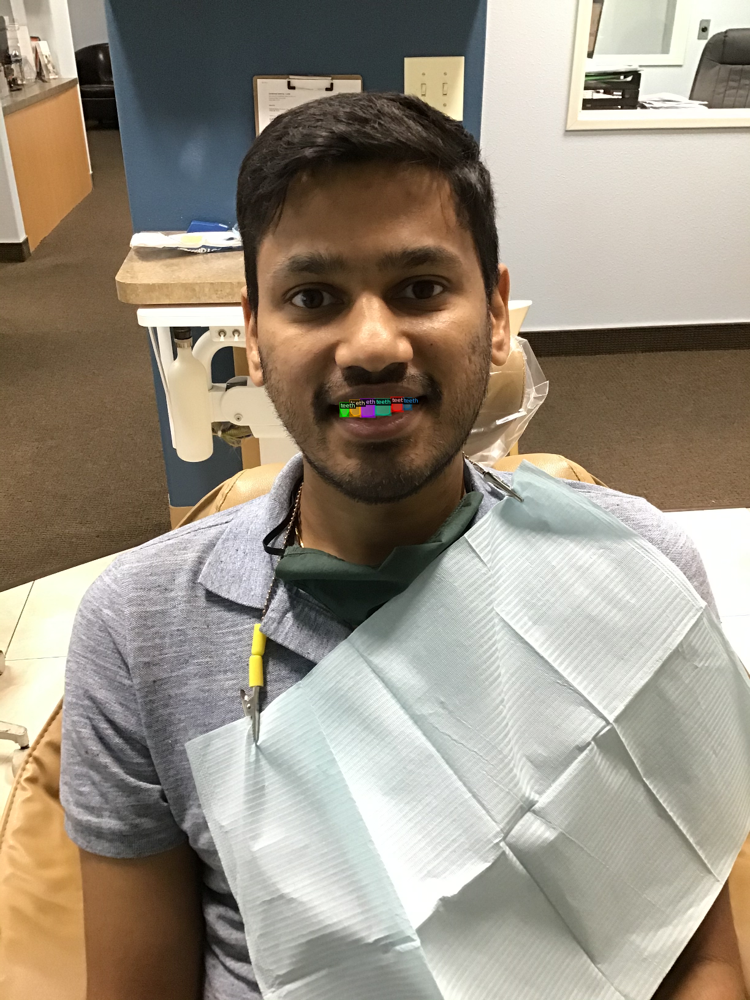

In [ ]:
dataset_dicts = load_data("/content/drive/MyDrive/result.json", "/content/drive/MyDrive/teeth-mask-rcnn")
for d in random.sample(dataset_dicts, 1):
    print("aaaaaaaaaaaaa=",d)
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=balloon_metadata, scale=0.5)
    print("ddddd=",d)
    out = visualizer.draw_dataset_dict(d)
    print(out.get_image())
    cv2_imshow(out.get_image()[:, :, ::-1])

In [ ]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("balloon_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2  # This is the real "batch size" commonly known to deep learning people
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 600    # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512   # The "RoIHead batch size". 128 is faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (ballon). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[03/23 09:39:34 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[{'image_id': 0, 'height': 4000, 'width': 6000, 'file_name': '/content/drive/MyDrive/teeth-mask-rcnn/COMPOSITE_PHOTO-CAZFG41770_310721041401.jpeg', 'annotations': [{'bbox': [2665.2520487291395, 2766.179013894782, 2725.3200532305273, 2836.6580369111057], 'bbox_mode': <BoxMode.XYXY_ABS: 0>, 'segmentation': [[2722.213087480456, 2836.6580369111057, 2699.4286719799293, 2824.220562261166, 2670.4303249792592, 2812.819543832055, 2665.2520487291395, 2792.0904194154896, 2668.3590144792115, 2766.179013894782, 2680.786877479499, 2768.251926336439, 2692.1790852297618, 2783.798769648863, 2704.606948230049, 2799.3456129612873, 2725.3200532305273, 2808.673718948742, 2724.2465081542623, 2818.343097106467]], 'category_id': 0}, {'bbox': [2730.498329480648, 2778.6164885447215, 2775.0315052316764, 2858.4236175485], 'bbox_mode': <BoxMode.XYXY_ABS: 0>, 'segmentation': [[2730.498329480648, 2838.730949352763, 2732.5696399806952, 2784.8352258696914, 2738.783571480839, 2778.6164885447215, 2746.0331582310064, 278

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




record1111111 {'image_id': 50, 'height': 640, 'width': 481}
image_file_name= COMPOSITE_PHOTO-PGJWQ54004_270721123205.jpeg
record222222 {'image_id': 50, 'height': 640, 'width': 481, 'file_name': '/content/drive/MyDrive/teeth-mask-rcnn/COMPOSITE_PHOTO-PGJWQ54004_270721123205.jpeg'}
record=== [{'bbox': [143.09129800586774, 405.0163207131848, 153.39387146229024, 422.1913349986769], 'bbox_mode': <BoxMode.XYXY_ABS: 0>, 'segmentation': [[143.09129800586774, 405.0163207131848, 144.23602838991465, 415.89382976066315, 147.6702195420555, 422.1913349986769, 152.24914107824327, 420.4738335701276, 153.39387146229024, 410.1688249988325, 149.38731511812588, 405.0163207131851]], 'category_id': 0}, {'bbox': [155.11096703836066, 406.73382214173415, 168.27536645490048, 425.6263378557751], 'bbox_mode': <BoxMode.XYXY_ABS: 0>, 'segmentation': [[157.40042780645453, 406.73382214173415, 155.11096703836066, 413.6038278559307, 156.25569742240756, 423.3363359510428, 164.26881011073615, 425.6263378557751, 168.2753

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[03/23 09:39:36 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|   teeth    | 1072         |
|            |              |
[03/23 09:39:36 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in training: [ResizeShortestEdge(short_edge_length=(640, 672, 704, 736, 768, 800), max_size=1333, sample_style='choice'), RandomFlip()]
[03/23 09:39:36 d2.data.build]: Using training sampler TrainingSampler
[03/23 09:39:36 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[03/23 09:39:36 d2.data.common]: Serializing 100 elements to byte tensors and concatenating them all ...
[03/23 09:39:36 d2.data.common]: Serialized dataset takes 0.27 MiB
[03/23 09:39:38 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://dl.fbaipublicfiles.com/detectron2/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl ...


model_final_f10217.pkl: 178MB [00:00, 237MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[03/23 09:39:41 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.9/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3190.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[03/23 09:40:11 d2.utils.events]:  eta: 0:08:18  iter: 19  total_loss: 5.214  loss_cls: 0.5937  loss_box_reg: 0.03104  loss_mask: 0.6961  loss_rpn_cls: 3.585  loss_rpn_loc: 0.3858    time: 0.9353  last_time: 1.7229  data_time: 0.5195  last_data_time: 1.1906   lr: 8.1588e-06  max_mem: 2673M
[03/23 09:40:33 d2.utils.events]:  eta: 0:07:40  iter: 39  total_loss: 1.988  loss_cls: 0.5331  loss_box_reg: 0.3326  loss_mask: 0.6775  loss_rpn_cls: 0.1255  loss_rpn_loc: 0.2642    time: 1.0324  last_time: 0.7978  data_time: 0.6359  last_data_time: 0.3332   lr: 1.6484e-05  max_mem: 2673M
[03/23 09:40:50 d2.utils.events]:  eta: 0:07:08  iter: 59  total_loss: 1.669  loss_cls: 0.389  loss_box_reg: 0.3414  loss_mask: 0.6327  loss_rpn_cls: 0.05068  loss_rpn_loc: 0.2638    time: 0.9676  last_time: 0.4411  data_time: 0.3448  last_data_time: 0.0180   lr: 2.4809e-05  max_mem: 2673M
[03/23 09:41:02 d2.utils.events]:  eta: 0:06:02  iter: 79  total_loss: 1.669  loss_cls: 0.333  loss_box_reg: 0.3675  loss_mask:

In [ ]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("balloon_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2  # This is the real "batch size" commonly known to deep learning people
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 600    # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512   # The "RoIHead batch size". 128 is faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (ballon). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

In [ ]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "/content/drive/MyDrive/model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

[03/24 05:45:02 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/drive/MyDrive/model_final.pth ...


In [ ]:
import cv2
from google.colab.patches import cv2_imshow


In [ ]:
def polygon_centroid(points):
    n = len(points)
    # print("points",points),
    area = 0.0
    x = 0.0
    y = 0.0
    print("len",n)
    for i in range(n):
        j = (i + 1) % n
        area += points[i][0][0] * points[j][0][1] - points[j][0][0] * points[i][0][1]
        x += (points[i][0][0] + points[j][0][0]) * (points[i][0][0] * points[j][0][1] - points[j][0][0] * points[i][0][1])
        y += (points[i][0][1] + points[j][0][1]) * (points[i][0][0] * points[j][0][1] - points[j][0][0] * points[i][0][1])

    area *= 0.5
    x /= 6 * area
    y /= 6 * area

    return (x, y)


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



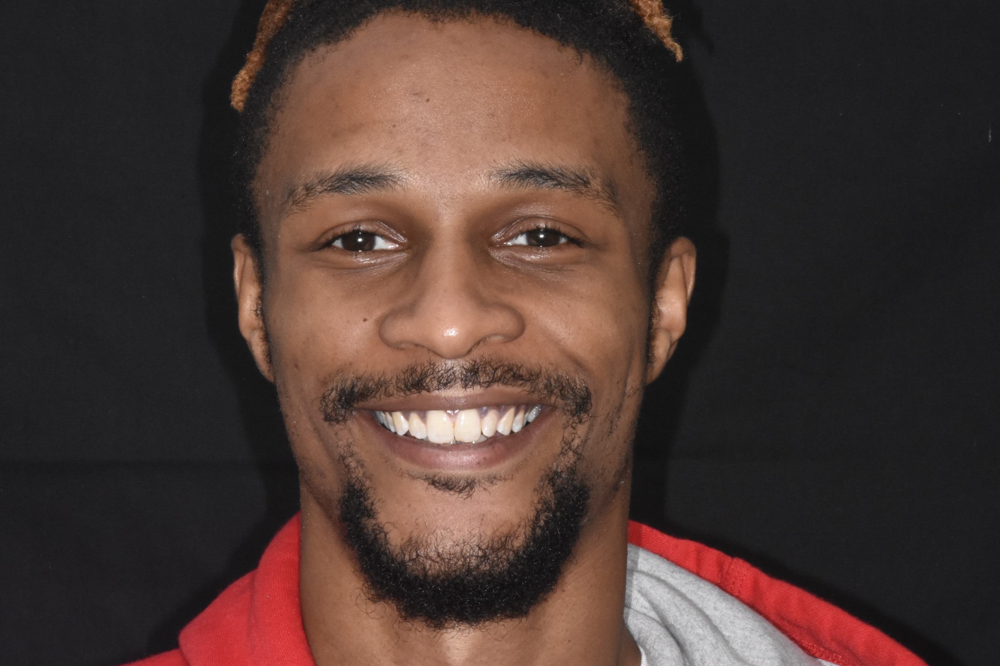

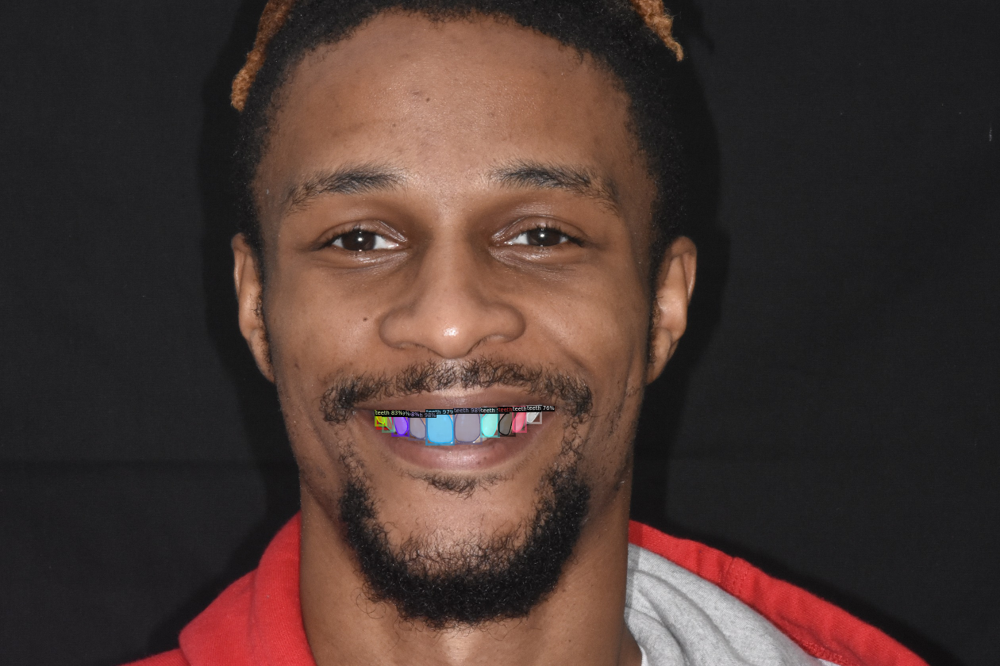

len 163
len 163
len 141
len 163
len 141
len 238
len 163
len 141
len 238
len 164
len 163
len 141
len 238
len 164
len 245
len 163
len 141
len 238
len 164
len 245
len 160
len 163
len 141
len 238
len 164
len 245
len 160
len 132
len 163
len 141
len 238
len 164
len 245
len 160
len 132
len 113
len 163
len 141
len 238
len 164
len 245
len 160
len 132
len 113
len 80
len 163
len 141
len 238
len 164
len 245
len 160
len 132
len 113
len 80
len 97
len 163
len 141
len 238
len 164
len 245
len 160
len 132
len 113
len 80
len 97
len 115


In [162]:
from detectron2.utils.visualizer import ColorMode
dataset_dicts = load_data("/content/drive/MyDrive/result.json", "/content/drive/MyDrive/teeth-mask-rcnn")

# for d in random.sample(dataset_dicts, 1):    
    # im = cv2.imread(d["file_name"])
im = cv2.imread("/content/COMPOSITE_PHOTO-YLQVW42767_150921093942.jpeg")
# to change shape of image
# im=cv2.resize(im, ( 1260,840))
cv2_imshow(im)
outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
# print("output========",outputs)
v = Visualizer(im[:, :, ::-1],
                metadata=balloon_metadata, 
                scale=0.5, 
              #  instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
# print("out===",outputs["instances"])
cv2_imshow(out.get_image()[:, :, ::-1])

contours = []
for pred_mask in outputs['instances'].pred_masks:
# pred_mask is of type torch.Tensor, and the values are boolean (True, False)
# Convert it to a 8-bit numpy array, which can then be used to find contours

  mask = pred_mask.cpu().numpy().astype('uint8')
#  print("kjdh==",mask)
  contour, _ = cv2.findContours(mask, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)
#  print("jhfjhjkfhjcke=====",contour)
  contours.append(contour[0]) 
#  print("contours---",contours)
  centroid_points=[]
  for cont in contours:
  #  print("ooooooooo==",polygon_centroid(cont))
    centroid_points.append(polygon_centroid(cont))
  #  print("fffffffffff==",centroid_points)
      

In [163]:
print(im.shape)

(1680, 2520, 3)


In [164]:
b_box=outputs['instances'].pred_boxes.tensor


In [165]:
bo=[]
bos=[]
boxes=b_box.cpu().numpy()
for boxs in boxes:
  bo.append(boxs[1])
  bos.append(boxs[0]+(boxs[2]-boxs[0])/2)
print(bo)
print(bos)

[1041.2334, 1039.3553, 1030.8053, 1030.1255, 1033.3663, 1027.1836, 1026.8718, 1037.7816, 1036.7246, 1024.4609, 1036.2782]
[1051.423095703125, 1007.6753845214844, 1178.141357421875, 1234.47998046875, 1107.9972534179688, 1276.0740966796875, 1308.1937255859375, 978.0203552246094, 958.9485778808594, 1344.4653930664062, 968.7172241210938]


In [166]:
upboxy=min(bo)
print(upboxy)
z=bo.index(upboxy)
upboxx=bos[z]
print(upboxx)

1024.4609
1344.4653930664062


In [167]:
import locale
print(locale.getpreferredencoding())

UTF-8


In [168]:
import locale
def getpreferredencoding(do_setlocale = True):
    return "UTF-8"
locale.getpreferredencoding = getpreferredencoding

In [169]:
!pip install mediapipe

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [170]:
import mediapipe as mp


In [171]:
mp_face_mesh = mp.solutions.face_mesh
face_mesh = mp_face_mesh.FaceMesh()

In [172]:
rgb_image = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
# Facial landmarks
result = face_mesh.process(rgb_image)

In [173]:
height, width, _ = im.shape

In [174]:

imgs=im.copy()

In [175]:

for facial_landmarks in result.multi_face_landmarks:
    sum=0
    sum1=0
    for i in range(0, 20):
        pt1 = facial_landmarks.landmark[i]
        x = int(pt1.x * width)
        y = int(pt1.y * height)
        # cv2.circle(im, (x, y), 5, (100, 100, 0), -1)
        # cv2.putText(im,str(i),(x,y),0,1,(0,0,0))
        if(i>=11 and i<=15):
          print(x,y)
          sum=sum+x
          sum1=sum1+y
    x1=sum/5
    y1=sum1/5
    print("x-avg=",x1)
    print("y-avg=",y1)      


          

1138 1025
1139 1036
1140 1036
1145 1136
1144 1152
x-avg= 1141.2
y-avg= 1077.0


In [176]:
def find_closest(arr, val):
       print("arr1=",arr)
       arr = np.asarray(arr)
       print("arr2=",arr)
       idx1 = (np.abs(arr - val))
       idx = (np.abs(arr - val)).argmin()
       return idx1
       

In [177]:
cent1=[]
for cent in centroid_points:
      cent1.append(cent[0])
print("cc=",cent1)      
idx1=find_closest(cent1,x1)
print("kkk",idx1)
# print("pos1=",pos1)
# i=cent1.index(pos1)
# print("index=",i)

cc= [1050.4250020480054, 1008.1048518397916, 1177.4627897086966, 1234.1567601838642, 1107.1008018327607, 1275.9546438410075, 1307.7282407407408, 978.487363660548, 958.3805243445693, 1342.9463414634147, 967.5899295065458]
arr1= [1050.4250020480054, 1008.1048518397916, 1177.4627897086966, 1234.1567601838642, 1107.1008018327607, 1275.9546438410075, 1307.7282407407408, 978.487363660548, 958.3805243445693, 1342.9463414634147, 967.5899295065458]
arr2= [1050.42500205 1008.10485184 1177.46278971 1234.15676018 1107.10080183
 1275.95464384 1307.72824074  978.48736366  958.38052434 1342.94634146
  967.58992951]
kkk [ 90.77499795 133.09514816  36.26278971  92.95676018  34.09919817
 134.75464384 166.52824074 162.71263634 182.81947566 201.74634146
 173.61007049]


In [178]:
cent2=[]
for cent in centroid_points:
      cent2.append(cent[1])

In [179]:
import matplotlib.pyplot as plt
import numpy as np

In [180]:
xpoints = np.array(cent1)
ypoints = np.array(cent2)
print(centroid_points)


print(xpoints)
print(ypoints)

[(1050.4250020480054, 1075.1105103629066), (1008.1048518397916, 1066.956583089113), (1177.4627897086966, 1073.9349705861507), (1234.1567601838642, 1065.7551909969884), (1107.1008018327607, 1076.5636780172863), (1275.9546438410075, 1064.858421881149), (1307.7282407407408, 1060.2310185185186), (978.487363660548, 1062.7424847033785), (958.3805243445693, 1051.8554307116106), (1342.9463414634147, 1044.5523809523809), (967.5899295065458, 1057.0147029204431)]
[1050.42500205 1008.10485184 1177.46278971 1234.15676018 1107.10080183
 1275.95464384 1307.72824074  978.48736366  958.38052434 1342.94634146
  967.58992951]
[1075.11051036 1066.95658309 1073.93497059 1065.755191   1076.56367802
 1064.85842188 1060.23101852 1062.7424847  1051.85543071 1044.55238095
 1057.01470292]


In [181]:
xm=xpoints.max()
xl=xpoints.min()
ym=ypoints.max()
yl=ypoints.min()

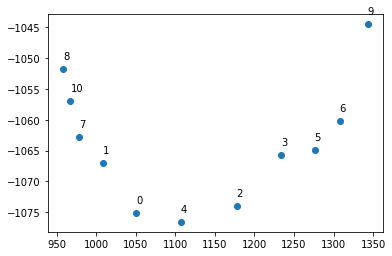

In [182]:
j=0
plt.plot(xpoints,-ypoints,'o')
for x,y in zip(xpoints,ypoints):
  label=j
  x=x
  y=-y
  j=j+1
  plt.annotate(label, # this is the text
                 (x,y), # these are the coordinates to position the label
                 textcoords="offset points", # how to position the text
                 xytext=(0,10) # distance from text to points (x,y)
                 )

In [183]:
for facial_landmarks in result.multi_face_landmarks:
    sum=[]
    a=[]
    b=[]
    img=im.copy()
    for i in range(0,462):
          if(i==308 or i==78 or i==191 or i==80 or i==81 or i==82 or i==13 or i==312 or i==311 or i==310 or i==415):
               pt1 = facial_landmarks.landmark[i]
               x = int(pt1.x * width)
               y = int(pt1.y * height)
               cv2.circle(img, (x, y), 5, (100, 100, 0), -1)
               cv2.putText(img,str(i),(x,y),0,1,(0,0,0))
               sum.append((x,y))
               a.append(x)
               b.append(y)
print(sum)
print(a)
print(b)
# cv2_imshow(im)  
# cv2_imshow(img)    

[(1140, 1036), (927, 1040), (985, 1025), (1026, 1028), (1077, 1033), (952, 1026), (1376, 1033), (1307, 1020), (1261, 1025), (1207, 1031), (1347, 1020)]
[1140, 927, 985, 1026, 1077, 952, 1376, 1307, 1261, 1207, 1347]
[1036, 1040, 1025, 1028, 1033, 1026, 1033, 1020, 1025, 1031, 1020]


In [184]:
aaa=a.copy()
bbb=b.copy()

In [185]:
print(a)
for i in range(0, len(a)):    
    for j in range(i+1, len(a)):    
        if(a[i] > a[j]):    
            temp = a[i];    
            a[i] = a[j];    
            a[j] = temp;    
     
print();    
     
#Displaying elements of the array after sorting    
    
print("Elements of array sorted in ascending order: ");    
print(a);    

[1140, 927, 985, 1026, 1077, 952, 1376, 1307, 1261, 1207, 1347]

Elements of array sorted in ascending order: 
[927, 952, 985, 1026, 1077, 1140, 1207, 1261, 1307, 1347, 1376]


In [186]:

add=[]
for i in a:
  for j in sum:
    if(i==j[0]):
      add.append(j)
print(add)


[(927, 1040), (952, 1026), (985, 1025), (1026, 1028), (1077, 1033), (1140, 1036), (1207, 1031), (1261, 1025), (1307, 1020), (1347, 1020), (1376, 1033)]


In [187]:

x=[]
y=[]
for a in add:
  x.append(a[0])
  y.append(a[1])
print(x)
print(y)
print(add)

[927, 952, 985, 1026, 1077, 1140, 1207, 1261, 1307, 1347, 1376]
[1040, 1026, 1025, 1028, 1033, 1036, 1031, 1025, 1020, 1020, 1033]
[(927, 1040), (952, 1026), (985, 1025), (1026, 1028), (1077, 1033), (1140, 1036), (1207, 1031), (1261, 1025), (1307, 1020), (1347, 1020), (1376, 1033)]


In [188]:
xxx=x.copy()
yyy=y.copy()

In [189]:
print(cent1)
print(cent2)

[1050.4250020480054, 1008.1048518397916, 1177.4627897086966, 1234.1567601838642, 1107.1008018327607, 1275.9546438410075, 1307.7282407407408, 978.487363660548, 958.3805243445693, 1342.9463414634147, 967.5899295065458]
[1075.1105103629066, 1066.956583089113, 1073.9349705861507, 1065.7551909969884, 1076.5636780172863, 1064.858421881149, 1060.2310185185186, 1062.7424847033785, 1051.8554307116106, 1044.5523809523809, 1057.0147029204431]


In [190]:
print(upboxx,upboxy)

1344.4653930664062 1024.4609


In [191]:
from scipy.interpolate import interp1d
from scipy.spatial.distance import euclidean
import numpy as np

# Define x and y coordinates of the curve
x_curve = x
y_curve = y

# Define the point
x_point = upboxx
y_point = upboxy


# Interpolate the curve to get a function that maps x to y
f1 = interp1d(x_curve, y_curve)

# Evaluate the function at the given x-coordinate to find the y-coordinate on the curve
y_nearest = f1(x_point)

# Calculate the distance between the point and the nearest point on the curve
distance = euclidean([x_point, y_point], [x_point, y_nearest])

print(distance)

4.4609375


In [192]:
for facial_landmarks in result.multi_face_landmarks:
    img=im.copy()
    sumx=[]
    sumy=[]
    for i in range(0,462):
          if(i==308 or i==78):
               pt1 = facial_landmarks.landmark[i]
               x = int(pt1.x * width)
               sumx.append(x)
               
          if(i==14 or i==13):
               pt1 = facial_landmarks.landmark[i]
               y = int(pt1.y * height)
               x=int(pt1.x * width)
              #  cv2.circle(im, (x, y), 5, (100, 100, 0), -1)
              #  cv2.putText(im,str(i),(x,y),0,1,(0,0,0))
               sumy.append(y)
            
       
    print(sumx)
    print(sumy)
# cv2_imshow(im)  
# cv2_imshow(img)      

[927, 1376]
[1036, 1136]


In [193]:
valx=abs(sumx[1]-sumx[0])
valy=abs(sumy[1]-sumy[0])
print(valx,valy)

449 100


In [194]:
mwid=valy/4
print(mwid)

25.0


In [195]:
newlin=[]
print(yyy)
for l in yyy:
  newlin.append(l+mwid+distance)
print(newlin)

[1040, 1026, 1025, 1028, 1033, 1036, 1031, 1025, 1020, 1020, 1033]
[1069.4609375, 1055.4609375, 1054.4609375, 1057.4609375, 1062.4609375, 1065.4609375, 1060.4609375, 1054.4609375, 1049.4609375, 1049.4609375, 1062.4609375]


In [196]:
print(bo)
print(bos)
print(xxx)
print(newlin)

[1041.2334, 1039.3553, 1030.8053, 1030.1255, 1033.3663, 1027.1836, 1026.8718, 1037.7816, 1036.7246, 1024.4609, 1036.2782]
[1051.423095703125, 1007.6753845214844, 1178.141357421875, 1234.47998046875, 1107.9972534179688, 1276.0740966796875, 1308.1937255859375, 978.0203552246094, 958.9485778808594, 1344.4653930664062, 968.7172241210938]
[927, 952, 985, 1026, 1077, 1140, 1207, 1261, 1307, 1347, 1376]
[1069.4609375, 1055.4609375, 1054.4609375, 1057.4609375, 1062.4609375, 1065.4609375, 1060.4609375, 1054.4609375, 1049.4609375, 1049.4609375, 1062.4609375]


In [197]:



# Define x and y coordinates of the curve
print(xxx)
x_curve = xxx
y_curve = newlin
up=[]
down=[]

for x in range(len(bo)):
 # Define the point
 x_point = bos[x]
 y_point = bo[x]


 # Interpolate the curve to get a function that maps x to y
 f2 = interp1d(x_curve, y_curve)

 # Evaluate the function at the given x-coordinate to find the y-coordinate on the curve
 y_nearest = f2(x_point)
 yxx=y_nearest-y_point
 if(yxx>=0):
   up.append(x_point)
 if(yxx<0):
   down.append(x_point)   
 
print("down=",down)
print("up=",up)


[927, 952, 985, 1026, 1077, 1140, 1207, 1261, 1307, 1347, 1376]
down= []
up= [1051.423095703125, 1007.6753845214844, 1178.141357421875, 1234.47998046875, 1107.9972534179688, 1276.0740966796875, 1308.1937255859375, 978.0203552246094, 958.9485778808594, 1344.4653930664062, 968.7172241210938]


In [198]:
downind=[]
for i in down:
  downind.append(bos.index(i))
print(downind)  
upind=[]
for i in up:
  upind.append(bos.index(i))
print(upind) 

[]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]


In [199]:
idx2=idx1.copy()
print(len(idx1))
print(idx1)
k=[]
for i in range(len(idx2)):
  a=idx2.argmin()
  print("a===",a)
  print("i===",i)
  k.append(a)
  print("k====",k)
  idx2[a]=float('inf')
  print(idx2)

print("vdbjhfgrevf===",k)  
print("jkkhdjkhckj===",idx1)








11
[ 90.77499795 133.09514816  36.26278971  92.95676018  34.09919817
 134.75464384 166.52824074 162.71263634 182.81947566 201.74634146
 173.61007049]
a=== 4
i=== 0
k==== [4]
[ 90.77499795 133.09514816  36.26278971  92.95676018          inf
 134.75464384 166.52824074 162.71263634 182.81947566 201.74634146
 173.61007049]
a=== 2
i=== 1
k==== [4, 2]
[ 90.77499795 133.09514816          inf  92.95676018          inf
 134.75464384 166.52824074 162.71263634 182.81947566 201.74634146
 173.61007049]
a=== 0
i=== 2
k==== [4, 2, 0]
[         inf 133.09514816          inf  92.95676018          inf
 134.75464384 166.52824074 162.71263634 182.81947566 201.74634146
 173.61007049]
a=== 3
i=== 3
k==== [4, 2, 0, 3]
[         inf 133.09514816          inf          inf          inf
 134.75464384 166.52824074 162.71263634 182.81947566 201.74634146
 173.61007049]
a=== 1
i=== 4
k==== [4, 2, 0, 3, 1]
[         inf          inf          inf          inf          inf
 134.75464384 166.52824074 162.71263634 182.81

In [200]:

print(k)

[4, 2, 0, 3, 1, 5, 7, 6, 10, 8, 9]


In [201]:
print(upind)
print(downind)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
[]


In [202]:
upperord=[]
downord=[]
for i in k:
  for j in upind:
    if(i==j):
      upperord.append(i)
  for s in downind:
    if(i==s):
      downord.append(i)

print(upperord)
print(downord)


[4, 2, 0, 3, 1, 5, 7, 6, 10, 8, 9]
[]


In [203]:

print(sumy)

[1036, 1136]


In [204]:
bboxmaxss=outputs['instances'][upperord[0].item()].pred_boxes.tensor
print(bboxmaxss)
a1=bboxmaxss.cpu().numpy()[0]
print(a1)

tensor([[1073.6637, 1033.3663, 1142.3308, 1120.7567]], device='cuda:0')
[1073.6637 1033.3663 1142.3308 1120.7567]


In [205]:
r1=abs((a1[3]-sumy[0])/270)
r2=abs((sumy[1]-a1[3])/126)
print(r1,r2)
ra1=abs(1-r1)
ra2=abs(1-r2)
print(ra1,ra2)
if(r1>=r2):
  ysca=r1
else:
   ysca=r2
print(ysca)

0.31391375506365743 0.12097846137152778
0.6860862449363425 0.8790215386284722
0.31391375506365743


In [206]:
xs1=a1[2].item()-a1[0].item()
ys1=a1[3].item()-a1[1].item()
print(xs1,ys1)

68.6671142578125 87.390380859375


In [207]:
yl1=a1[3].item()
print(yl1)

1120.7567138671875


In [208]:
xs2=667-517
ys2=270-104

In [209]:
x_scale=xs1/xs2
y_scale=ys1/ys2

In [210]:
print(x_scale,y_scale)

0.45778076171875 0.5264480774661144


In [211]:
!pip install mediapipe==0.8.10.1
!pip install numpy==1.19.5
!pip install opencv-contrib-python==4.6.0.66
!pip install opencv-python==4.5.5.64
!pip install Pillow==9.2.0
!pip install scipy==1.9.0

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached numpy-1.19.5-cp39-cp39-manylinux2010_x86_64.whl (14.9 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 1.24.2
    Uninstalling numpy-1.24.2:
      Successfully uninstalled numpy-1.24.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
xarray 2022.12.0 requires numpy>=1.20, but you have numpy 1.19.5 which is incompatible.
xarray-einstats 0.5.1 requires numpy>=1.20, but you have numpy 1.19.5 which is incompatible.
tensorflow 2.11.0 requires numpy>=1.20, but you have numpy 1.19.5 which is incompatible.
pyerfa 2.0.0.2 requires numpy>=1.21, but you have numpy 1.19.5 which is incompatible.
matplotlib 3.7.1 requires numpy>=1.20, but you 

In [212]:
import cv2
import mediapipe as mp
import pathlib
import numpy as np
from PIL import Image,ImageDraw
import os
from subprocess import call
import sys
import matplotlib.pyplot as plt
from scipy.interpolate import splprep, splev
import numpy as np

In [213]:
def hsv_conversion(img):
	hsv = cv2.cvtColor(img,cv2.COLOR_BGR2HSV)
	return hsv

In [214]:
def create_histogram(hsv):
    hist = cv2.calcHist([hsv],channels,None, histSize, ranges, accumulate=False)
    return hist

In [215]:
h_bins = 50
s_bins = 60
histSize = [h_bins, s_bins]
h_ranges = [0, 180]
s_ranges = [0, 256]
ranges = h_ranges + s_ranges
channels = [0, 1]

In [216]:
teeth_to_replace1 = cv2.imread("/content/teeth 1.png")
teeth_to_replace2 = cv2.imread("/content/teeth 2.png")
teeth_to_replace3 = cv2.imread("/content/teeth 7.png")
teeth_to_replace4 = cv2.imread("/content/teeth 17.png")
teeth_to_replace5 = cv2.imread("/content/teeth 5.png")
teeth_to_replace6 = cv2.imread("/content/teeth 14.png")
teeth_to_replace7 = cv2.imread("/content/teeth 11.png")
# conversion to hsv
		
hsv2 = hsv_conversion(teeth_to_replace1)
hsv3 = hsv_conversion(teeth_to_replace2)
hsv4 = hsv_conversion(teeth_to_replace3)
hsv5 = hsv_conversion(teeth_to_replace4)
hsv6 = hsv_conversion(teeth_to_replace5)
hsv7 = hsv_conversion(teeth_to_replace6)
hsv8 = hsv_conversion(teeth_to_replace7)
hist_dict = {}
# creating histogram
hist2 = create_histogram(hsv2)
hist_dict.update({"teeth 1":hist2})
hist3 = create_histogram(hsv3)
hist_dict.update({"teeth 2":hist3})
hist4 = create_histogram(hsv4)
hist_dict.update({"teeth 7":hist4})
hist5 = create_histogram(hsv5)
hist_dict.update({"teeth 17":hist5})
hist6 = create_histogram(hsv6)
hist_dict.update({"teeth 5":hist6})
hist7 = create_histogram(hsv7)
hist_dict.update({"teeth 14":hist7})
hist8 = create_histogram(hsv8)
hist_dict.update({"teeth 11":hist8})

In [217]:
compare_method = cv2.HISTCMP_CORREL  # compare method used for histogram comparison

In [218]:
print("before path")
image_path = "/content/COMPOSITE_PHOTO-YLQVW42767_150921093942.jpeg"   
print("Image_path",image_path)
PATH_TO_TEST_IMAGES_DIR = pathlib.Path(image_path)
# extensions = ("*.jpg","*.jpeg","*.jfif","*.png")
TEST_IMAGE_PATHS = []
print(PATH_TO_TEST_IMAGES_DIR)
# for extension in extensions:
TEST_IMAGE_PATHS=PATH_TO_TEST_IMAGES_DIR
print(TEST_IMAGE_PATHS) 

before path
Image_path /content/COMPOSITE_PHOTO-YLQVW42767_150921093942.jpeg
/content/COMPOSITE_PHOTO-YLQVW42767_150921093942.jpeg
/content/COMPOSITE_PHOTO-YLQVW42767_150921093942.jpeg


In [219]:
images=TEST_IMAGE_PATHS
	
print(images)
image_name = str(images).split('\\')[-1].split(".")[0]
print(image_name)
image = cv2.imread(str(images))


/content/COMPOSITE_PHOTO-YLQVW42767_150921093942.jpeg
/content/COMPOSITE_PHOTO-YLQVW42767_150921093942


In [220]:
h,w,_ = image.shape
rgb = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)

In [221]:
		# using mediapipe.FaceMesh for lips keypoints generation
inner_lip = [13,312,311,310,415,308,324,318,402,317,14,87,178,88,95,78,191,80,81,82]
# inner_lip = [12,268,271,272,407,308,325,319,402,317,14,87,178,89,96,78,183,42,41,38]

face_mesh_detector = mp.solutions.face_mesh   
face_mesh = face_mesh_detector.FaceMesh(static_image_mode=True,refine_landmarks=True,max_num_faces=1,min_detection_confidence=0.5)
result = face_mesh.process(rgb)
shape = []
shapex= []
shapey=[]
for i in result.multi_face_landmarks:
			for j in inner_lip:
				pt1 = i.landmark[j]
				x = int(pt1.x*w)
				y = int(pt1.y*h)
				shapex.append(x)
				shapey.append(y)
				shape.append((x,y))
print(shapex)
print(shapey)
print(shape)		

[1146, 1213, 1269, 1314, 1352, 1383, 1345, 1313, 1268, 1214, 1149, 1087, 1035, 993, 963, 925, 954, 989, 1030, 1083]
[1037, 1032, 1027, 1025, 1027, 1032, 1068, 1091, 1110, 1124, 1131, 1128, 1116, 1099, 1078, 1045, 1039, 1036, 1034, 1035]
[(1146, 1037), (1213, 1032), (1269, 1027), (1314, 1025), (1352, 1027), (1383, 1032), (1345, 1068), (1313, 1091), (1268, 1110), (1214, 1124), (1149, 1131), (1087, 1128), (1035, 1116), (993, 1099), (963, 1078), (925, 1045), (954, 1039), (989, 1036), (1030, 1034), (1083, 1035)]


In [222]:
print(shapex)
minx=min(shapex)
maxx=max(shapex)
print(minx)
miny=min(shapey)
maxy=max(shapey)
wid=maxx-minx
hei=maxy-miny
shax=[]
shay=[]
sha=[]
for x in range(0,5):
  shax.append(shapex[x])
  shay.append(shapey[x])
  sha.append((shapex[x],shapey[x]))

[1146, 1213, 1269, 1314, 1352, 1383, 1345, 1313, 1268, 1214, 1149, 1087, 1035, 993, 963, 925, 954, 989, 1030, 1083]
925


In [223]:
shapex.append(shapex[0])
shapey.append(shapey[0])
tck, _ = splprep([shapex, shapey], s = 0, per = True)
xx, yy = splev(np.linspace(0, 1, 100), tck, der = 0)
shapes=[]
for i,j in zip(xx,yy):
			shapes.append((i,j))
print(shapes)		

[(1146.0000000000005, 1037.0), (1155.7978590031255, 1036.7057868721981), (1165.5887493450896, 1036.1965383929426), (1175.3695773987426, 1035.5135052381245), (1185.1372495369333, 1034.6979380836342), (1194.888672132512, 1033.791087605362), (1204.6207515583283, 1032.834204479199), (1214.3304050886486, 1031.86852263613), (1224.0207181250778, 1030.925801577504), (1233.7112285773244, 1030.0125292559717), (1243.4241878073472, 1029.1310256796842), (1253.1818471771044, 1028.283610856794), (1263.0064580485544, 1027.4726047954532), (1272.918945986425, 1026.701001626114), (1282.8868906759965, 1025.9989200244684), (1292.807510624266, 1025.432254905785), (1302.573213509963, 1025.069347326073), (1312.076407011817, 1024.9785383413414), (1321.2607645516248, 1025.2121027759772), (1330.457359058364, 1025.7009078663914), (1340.174285343243, 1026.3203437527584), (1350.9205484634963, 1026.9455153121805), (1362.8197500772483, 1027.5533800076623), (1373.9497337981597, 1028.6615385540508), (1381.7121742951294

In [224]:
# import numpy as np
# from scipy.interpolate import CubicSpline

# # Assuming you have two arrays x and y containing the x and y coordinates of the points
# # sorted in a clockwise or counterclockwise order
# x = shax
# y = shay

# # Create a cubic spline that passes through each point
# cs = CubicSpline(x, y)

# # Evaluate the cubic spline at a set of points to create a smooth curve
# curve_x = np.linspace(min(x), max(y), 1000)
# curve_y = cs(curve_x)
# shapes1=[]
# for i,j in zip(curve_x,curve_y):
# 			shapes1.append((i,j))
# print(shapes1)

In [225]:
!pip install --ignore-installed Pillow==9.0.0

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached Pillow-9.0.0-cp39-cp39-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (4.3 MB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
matplotlib 3.7.1 requires numpy>=1.20, but you have numpy 1.19.5 which is incompatible.
arviz 0.15.1 requires numpy>=1.20.0, but you have numpy 1.19.5 which is incompatible.


In [226]:
		# image comparison to select best perfect teeth to replace
		x1 = shape[15][0]
		y1 = shape[0][1]
		x2 = shape[5][0]
		y2 = shape[10][1]
		
		cropped_teeth = image[int(y1+5):int(y2-8),int(x1+35):int(x2-35)]
		hsv1 = hsv_conversion(cropped_teeth)
		hist1 = create_histogram(hsv1)
		
		# creating mask around the lips
		im = Image.open(str(images))
		ImageDraw.Draw(im).polygon(shapes,fill="white",outline="white")
		
		# adding transparency to the mask
		rgba = im.convert("RGBA")
		# print("********")
		datas = rgba.getdata()
		newData = []
		for item in datas:
			if item[0] == 255 and item[1] == 255 and item[2] == 255:
				newData.append((255,255,255,0))
			else:
				newData.append(item)
		rgba.putdata(newData)

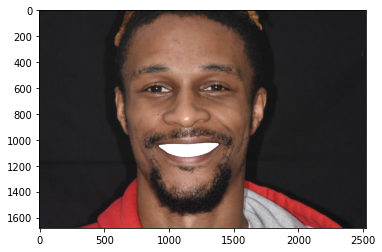

(2520, 1680)


In [227]:
plt.imshow(rgba)
plt.show()
print(rgba.size)

In [228]:
		# creating white image for overlaying perfect teeth
		imgwhite = np.zeros([h,w,3],dtype = np.uint8)
		imgwhite[:,:,1] = 255
		comparison_value = {}
		# selecting the perfect_teeth to replace
		for key ,value in hist_dict.items():
			base = cv2.compareHist(hist1,value,compare_method)
			comparison_value[key] = base

In [229]:
ljp=0

In [230]:
# print("ljp",ljp)
for ljp in range(0,50):
		print("ljp=",ljp)
		Keymax = max(zip(comparison_value.values(), comparison_value.keys()))
		print(Keymax[1])
		teeth_to_replace = cv2.imread("/content/"+Keymax[1]+".png")
		print("P",teeth_to_replace.shape[0])
		print("perfect_teeth/"+Keymax[1]+".png")
		teeth_to_replace = cv2.cvtColor(teeth_to_replace,cv2.COLOR_BGR2RGB)
		print("uuuu",teeth_to_replace.shape[0])
		h=teeth_to_replace.shape[0]
		w=teeth_to_replace.shape[1]
		#placing perfect teeth over white background image
		teeth_width1 = shape[5][0]-shape[15][0]
		teeth_width2=round(w*y_scale)
		if(wid>teeth_width2):
			teeth_width=wid
			# print("1")
		else:
			teeth_width=teeth_width2
			# print("2")
		print("tt",teeth_width)
		g=round((teeth_width-	wid_dif)/2)
		g=g+5
		print("g",g)
		teeth_height1 = -(shape[0][1] - shape[10][1])
		teeth_height2 =round(h*y_scale)
		if(hei>teeth_height2):
			teeth_height=hei
			# print("3")
		else:
			teeth_height=teeth_height2
			# print("4")
		replaceteeth = cv2.resize(teeth_to_replace,(teeth_width+round(teeth_width*0.015*ljp),teeth_height+round(teeth_height*0.015*ljp)))
		rw,rh,rc = replaceteeth.shape
		# print("kkk",y_scale)
		z=270*y_scale
		# print("zzz",z)
		k=round(y_scale*100)
		# print("yl1",yl1)
		# print("y",y)
		# print("z",z)
		yl=round(yl1-y-z)
		# print("lll",yl)
		for i in range(0,rw):
					for j in range(0,rh):
						if replaceteeth[i,j][0] !=0 and  replaceteeth[i,j][1] != 0 and replaceteeth[i,j][2] !=0:
							imgwhite[shape[0][1]-round(z*0.005*ljp)+i+yl,shape[15][0]+j-round(g*(1+0.01*ljp))] = replaceteeth[i,j]

				# overlaying the transparent mask image over the perfect teeth white background image.
		frontImage = rgba
		background = imgwhite
		backgrounds = Image.fromarray(background)
		backgrounds.paste(frontImage,(0,0),frontImage)
		# backgrounds.save("a1" +".png",format="png")

		# Load the image
		img = np.array(backgrounds)

		# Define the pure green color in RGB
		green = (0, 255, 0)

		# Create a numpy array with the pure green color
		green_np = np.array(green, dtype=np.uint8)

		# Convert the image to RGB color space
		img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

		# Check if the pure green color is present in the image
		is_green_present = np.any(np.all(img_rgb == green_np, axis=-1))

		if is_green_present:
				print('The image contains pure green color.')
				ljp=ljp+1
				print(ljp)
		else:
				print('The image does not contain pure green color.')
				break
				# print(ljp) 
print(ljp)	

ljp= 0
teeth 17
P 396
perfect_teeth/teeth 17.png
uuuu 396
tt 569
g 61
The image does not contain pure green color.
0


In [231]:
backgrounds.save("a5" +".png",format="png")

In [232]:
  import cv2
  import numpy as np

  # Load the image
  img = np.array(backgrounds)

  # Define the pure green color in RGB
  green = (0, 255, 0)

  # Create a numpy array with the pure green color
  green_np = np.array(green, dtype=np.uint8)

  # Convert the image to RGB color space
  img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

  # Check if the pure green color is present in the image
  is_green_present = np.any(np.all(img_rgb == green_np, axis=-1))

  if is_green_present:
      print('The image contains pure green color.')
      ljp=ljp+1
      print(ljp)
  else:
      print('The image does not contain pure green color.')
      ljp=-1
      print(ljp)

The image does not contain pure green color.
-1


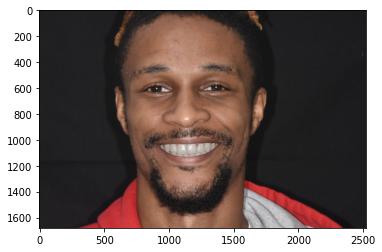

In [233]:
plt.imshow(backgrounds)
plt.show()